<a href="https://colab.research.google.com/github/natchanapat/CSS496-Digital-ImageProcessing-KMUTT/blob/main/HW2_Image_Enhancement(2)_CSS496.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


##**HW2 Image Enhancement(2)**

Natchanapat Promana 62070505208

Write a python code to propose a solution to 
enhance image using knowledge that we’ve learned!
Design your proposed method for improving the 
image quality.

Histopathologic images of H&E-stained tissues(Fibro-osseous lesions of Jaw:Cemento-osseous dysplasia) using Olympus CX31 microscope equipped with Canon EOS 600D EOS Digital SLR Camera at 100X magnification.

Objective: Improving the image quality for increase detail of lesions

In [ ]:
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
import cv2

###**Read Image**

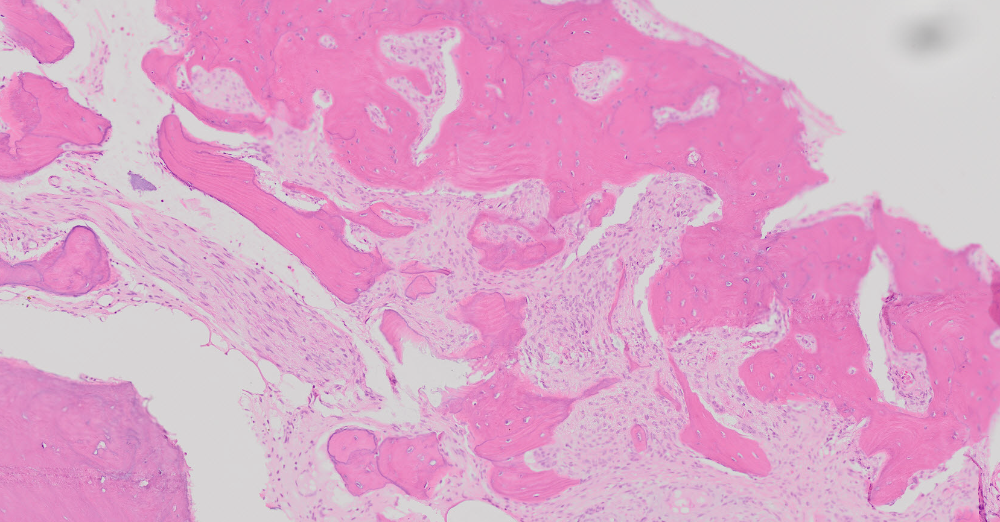

In [ ]:
image = cv2.imread("/content/ce_005_a.png")
cv2_imshow(image)

###**Convert RGB image to Gray-scale**

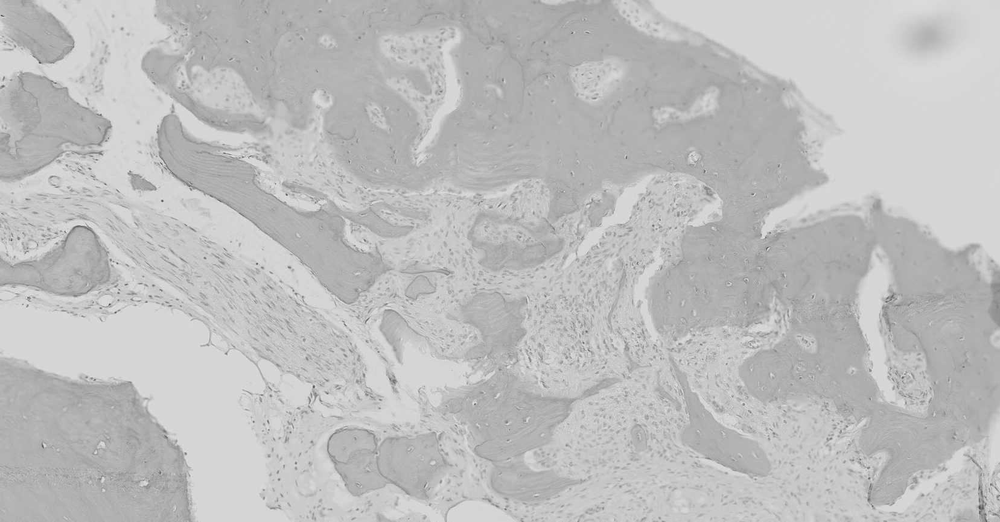

In [ ]:
img_gray = cv2.imread('/content/ce_005_a.png',0)

cv2_imshow(img_gray)

cv2.waitKey(0)

cv2.destroyAllWindows()

###**Gray Level Transformation**

In [ ]:
def GLT (img_gray, transform, coeff = 1.0, gamma = 1.0):
  #build lookup table to map the pixel value [0,255] to their gray level transformation 
  if transform == 'negative':
    table = np.array([256-1-i for i in np.arange (0,256)]).astype("uint8")

  elif transform == 'identity':
    table = np.array([i for i in np.arange (0,256)]).astype("uint8") 

  elif transform == 'log':
    table = np.array([10*coeff*(np.log10(1+i)) for i in np.arange (0,256)]).astype("uint8") 
  
  elif transform == 'invlog':
    table = np.array([10*coeff/(np.log10 (1+i)+1) for i in np.arange (0,256)]).astype("uint8")

  elif transform == 'root' :
    invGamma = 1.0/gamma 
    table = np.array([coeff*((i/255.0)**invGamma)*255 for i in np.arange (0,256)]).astype("uint8")

  elif transform == 'power':
    table = np.array([coeff*((i/255.0)**gamma)*255 for i in np.arange (0,256)]).astype("uint8") 
    
  return cv2.LUT(img_gray, table)

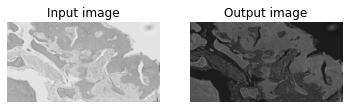

In [ ]:
transform = 'negative'
coeff = -1 # For negative c = -1; for identity c = 1; for other, c is integer 
gamma = 2.5 # Gamma is used for root and power 

img1 = GLT(img_gray, transform, coeff = coeff, gamma = gamma) 

plt.subplot(121) 
plt.imshow(img_gray, 'gray') 
plt.title('Input image', fontsize=12)
plt.axis("off") 

plt.subplot(122) 
plt.imshow(img1, 'gray') 
plt.title('Output image', fontsize=12) 
plt.axis("off") 
plt.show()

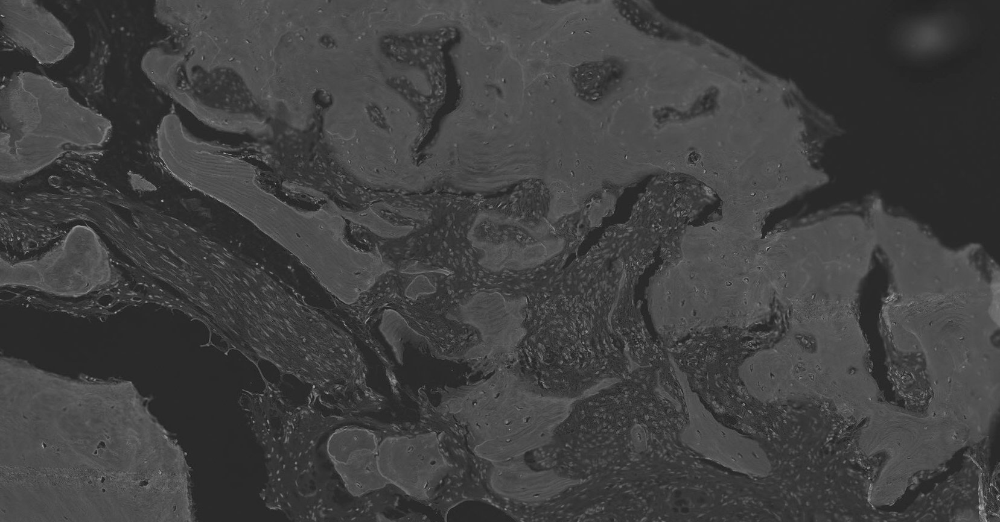

In [ ]:
cv2_imshow(img1)

###**Use power-law transformation**

becasuse power gives brightness to darkness

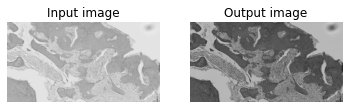

In [ ]:
transform = 'power'
coeff = 1 # For negative c = -1; for identity c = 1; for other, c is integer 
gamma = 4 # Gamma is used for root and power 

img = GLT(img_gray, transform, coeff = coeff, gamma = gamma) 

plt.subplot(121) 
plt.imshow(img_gray, 'gray') 
plt.title('Input image', fontsize=12)
plt.axis("off") 

plt.subplot(122) 
plt.imshow(img, 'gray') 
plt.title('Output image', fontsize=12) 
plt.axis("off") 
plt.show()

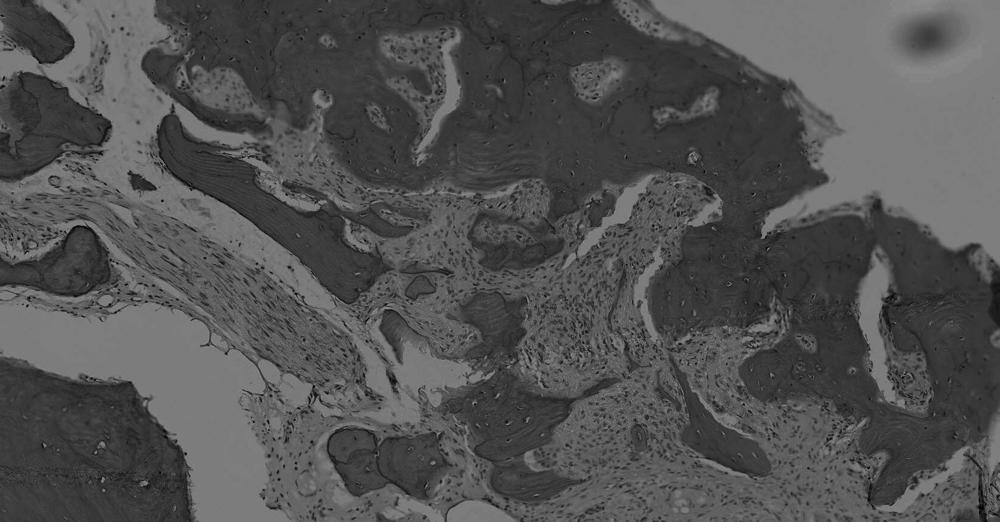

In [ ]:
cv2_imshow(img)

###**Histogram Equalization**

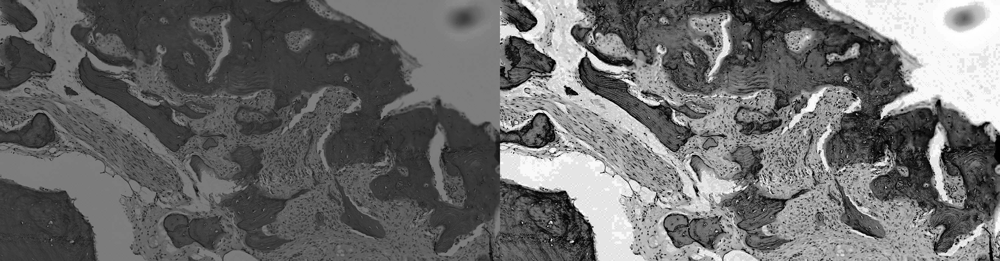

In [ ]:
img = cv2.imread('/content/img_gray_power.png',0)
img_his1 = cv2.equalizeHist(img)
res = np.hstack((img,img_his1)) 
cv2.imwrite('img_his_power.png', img_his1)
cv2_imshow(res)

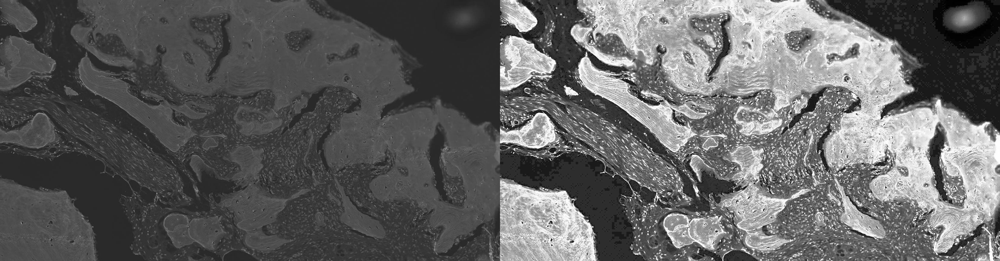

In [ ]:
img = cv2.imread('/content/img_gray_negative.png',0)
img_his2 = cv2.equalizeHist(img)
res = np.hstack((img,img_his2)) 
cv2.imwrite('img_his_neg.png', img_his2)
cv2_imshow(res)

###**Piecewise linear contrast stretching**

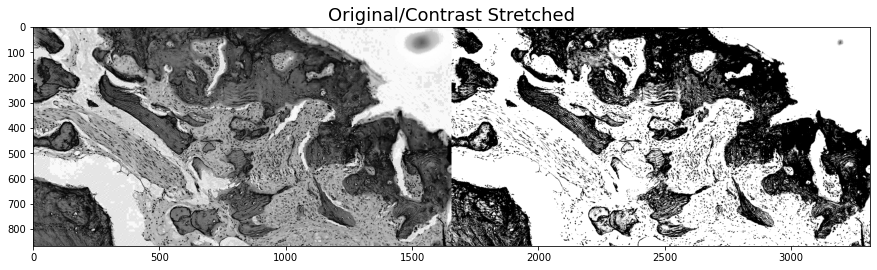

In [ ]:
def pixelVal(pix, r1, s1, r2, s2): 
    if (0 <= pix and pix <= r1): 
        return (s1/r1)*pix 
    elif (r1 < pix and pix <= r2): 
        return ((s2-s1)/(r2-r1)) * (pix-r1) + s1 
    else: 
        return ((255-s2)/(255-r2)) * (pix-r2) + s2 

img_con1 = cv2.imread('img_his_power.png',0) #Select image using power

r1 = 80
s1 = 0
r2= 120
s2 = 255
pixelVal_vec = np.vectorize(pixelVal)
contrast_stretched = pixelVal_vec(img_his1, r1, s1, r2, s2)
equ=np.hstack((img_his1,contrast_stretched))
plt.figure(figsize=[15,15])
plt.title("Original/Contrast Stretched", fontsize=18)
plt.imshow(equ,'gray')
plt.show()

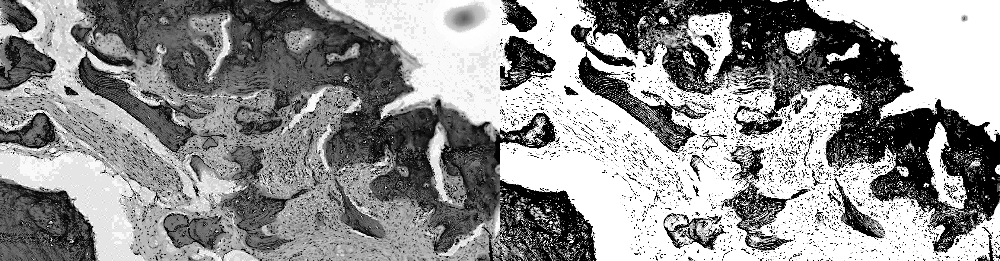

In [ ]:
cv2_imshow(equ)

###**Median Filter**

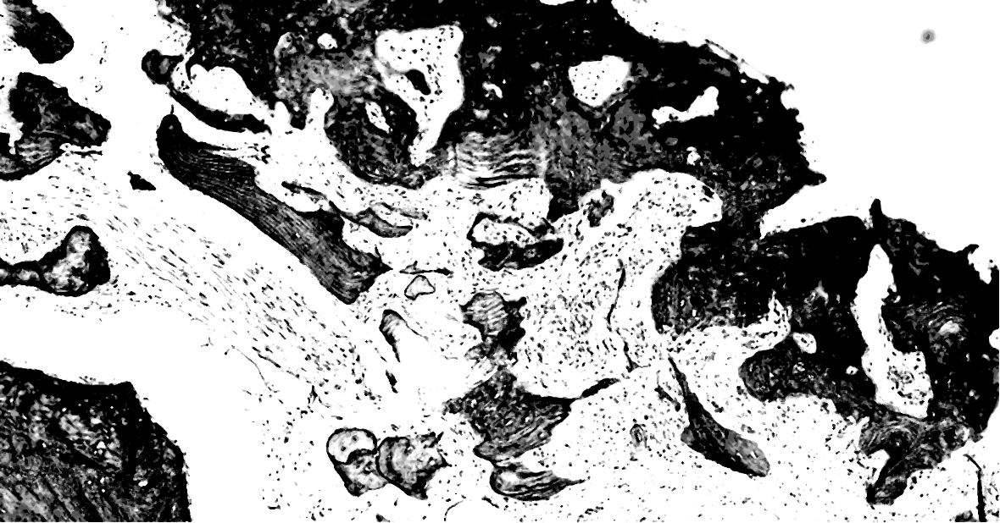

<function destroyAllWindows>

In [ ]:
img = cv2.imread('/content/img_piecewise.png')
median = cv2.medianBlur(img, 3)

cv2_imshow(median)
cv2.waitKey(0)
cv2.destroyAllWindows